first to import libraries


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")
import os
import glob as gb
import cv2
import tensorflow as tf
import keras

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
trainpath = '/kaggle/input/plant-disease-recognition-dataset/Train'
testpath = '/kaggle/input/plant-disease-recognition-dataset/Test'
predpath = '/kaggle/input/plant-disease-recognition-dataset/Validation'

# Open Folders

In [3]:
for folder in  os.listdir(trainpath + '/Train') : #open first class
    files = gb.glob(pathname= str( trainpath +'/Train//' + folder + '/*.jpg'))#for loop on each folder
    print(f'For training data , found {len(files)} in folder {folder}')#length of each folder

For training data , found 458 in folder Healthy
For training data , found 434 in folder Rust
For training data , found 430 in folder Powdery


In [4]:
for folder in  os.listdir(testpath + '/Test') : #open first class
    files = gb.glob(pathname= str( testpath +'/Test//' + folder + '/*.jpg'))#for loop on each folder
    print(f'For testing data , found {len(files)} in folder {folder}')#length of each folder

For testing data , found 50 in folder Healthy
For testing data , found 50 in folder Rust
For testing data , found 50 in folder Powdery


In [5]:
for folder in  os.listdir(predpath + '/Validation') : #open first class
    files = gb.glob(pathname= str( predpath +'/Validation//' + folder + '/*.jpg'))#for loop on each folder
    print(f'For predicting data , found {len(files)} in folder {folder}')#length of each folder

For predicting data , found 20 in folder Healthy
For predicting data , found 20 in folder Rust
For predicting data , found 20 in folder Powdery


In [6]:
code = {'Healthy':0 ,'Powdery':1,'Rust':2}

def getcode(n) : 
    for x , y in code.items() : 
        if n == y : 
            return x    

In [7]:
size = []
for folder in  os.listdir(trainpath +'/Train') : 
    files = gb.glob(pathname= str( trainpath +'/Train//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()#how many images have the same shape

(2672, 4000, 3)    976
(1728, 2592, 3)    105
(3456, 5184, 3)     82
(3000, 4000, 3)     80
(3456, 4608, 3)     63
(3024, 4032, 3)     15
(2279, 2421, 3)      1
dtype: int64

In [8]:
size = []
for folder in  os.listdir(testpath +'/Test') : 
    files = gb.glob(pathname= str( testpath +'/Test//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(2672, 4000, 3)    111
(1728, 2592, 3)     17
(3456, 5184, 3)     10
(3000, 4000, 3)      6
(3456, 4608, 3)      5
(2607, 3901, 3)      1
dtype: int64

In [9]:
size = []
for folder in  os.listdir(predpath +'/Validation') : 
    files = gb.glob(pathname= str( predpath +'/Validation//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(2672, 4000, 3)    43
(3456, 5184, 3)     5
(1728, 2592, 3)     5
(3456, 4608, 3)     4
(3000, 4000, 3)     2
(3024, 4032, 3)     1
dtype: int64

# Reading Images


In [10]:
s = 100


In [11]:
X_train = []
y_train = []
for folder in  os.listdir(trainpath +'/Train') : 
    files = gb.glob(pathname= str( trainpath +'/Train//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_train.append(list(image_array))
        y_train.append(code[folder])

how many items in X_train

In [12]:
print(f'we have {len(X_train)} items in X_train')

we have 1322 items in X_train


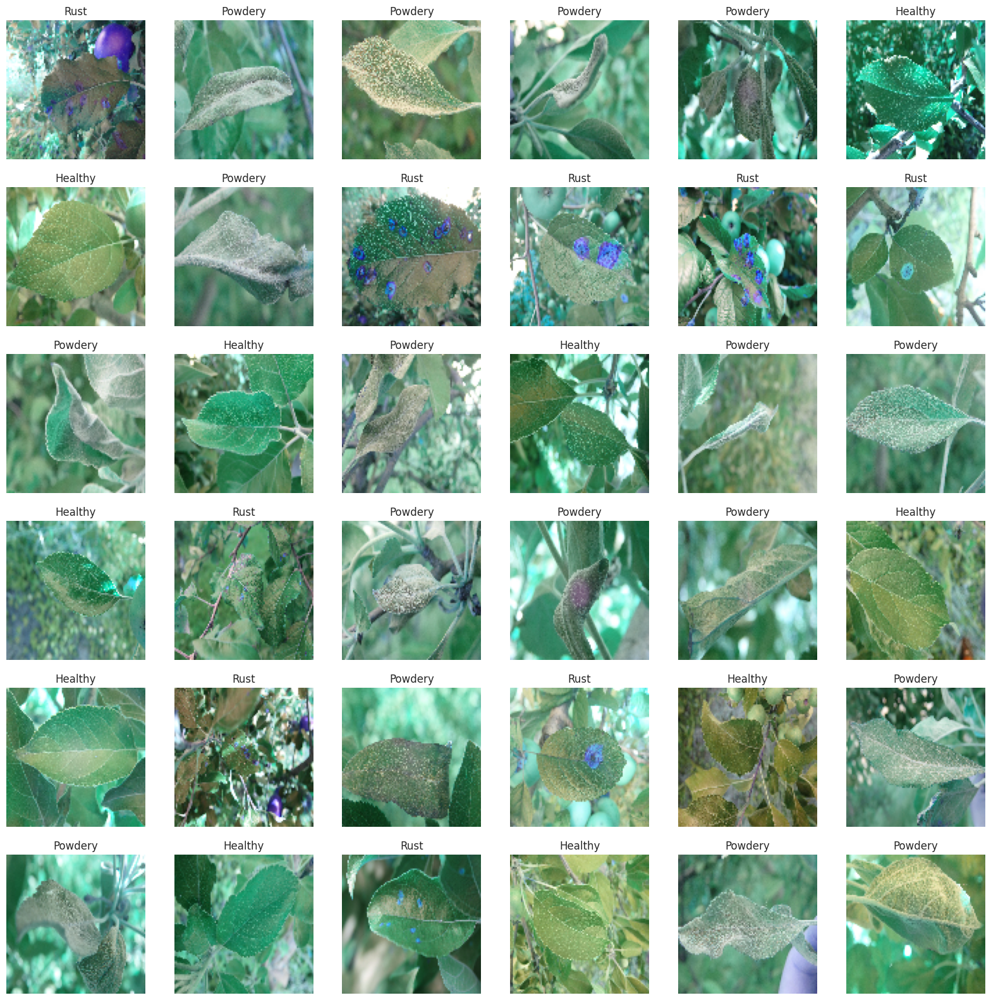

In [13]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_train),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])   
    plt.axis('off')
    plt.title(getcode(y_train[i]))

repeat same steps exactly in test data

In [14]:
X_test = []
y_test = []
for folder in  os.listdir(testpath +'/Test') : 
    files = gb.glob(pathname= str(testpath + '/Test//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_test.append(list(image_array))
        y_test.append(code[folder])

In [15]:
print(f'we have {len(X_test)} items in X_test')

we have 150 items in X_test


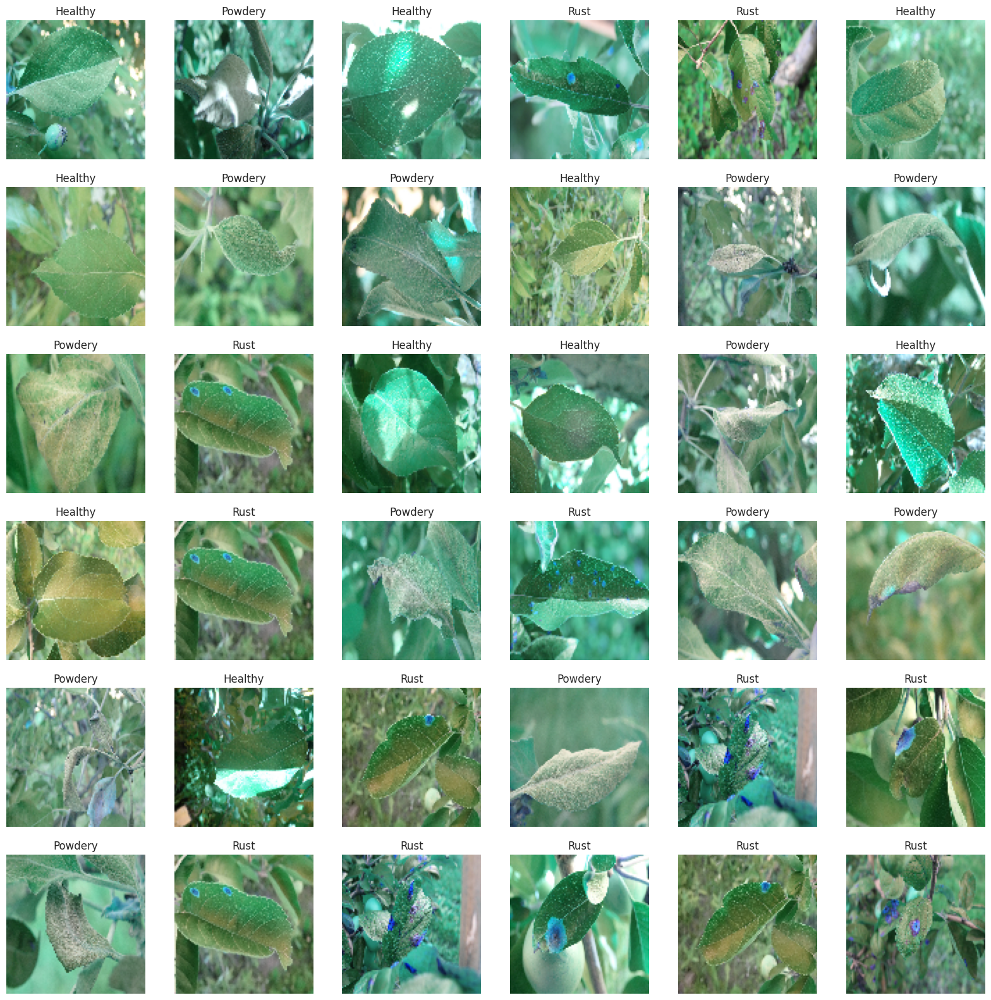

In [16]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_test),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])    
    plt.axis('off')
    plt.title(getcode(y_test[i]))

In [21]:
X_pred = []
y_pred = []
for folder in  os.listdir(predpath +'/Validation') : 
    files = gb.glob(pathname= str(predpath + '/Validation//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_pred.append(list(image_array))
        y_pred.append(code[folder])  

In [22]:
print(f'we have {len(X_pred)} items in X_pred')

we have 60 items in X_pred


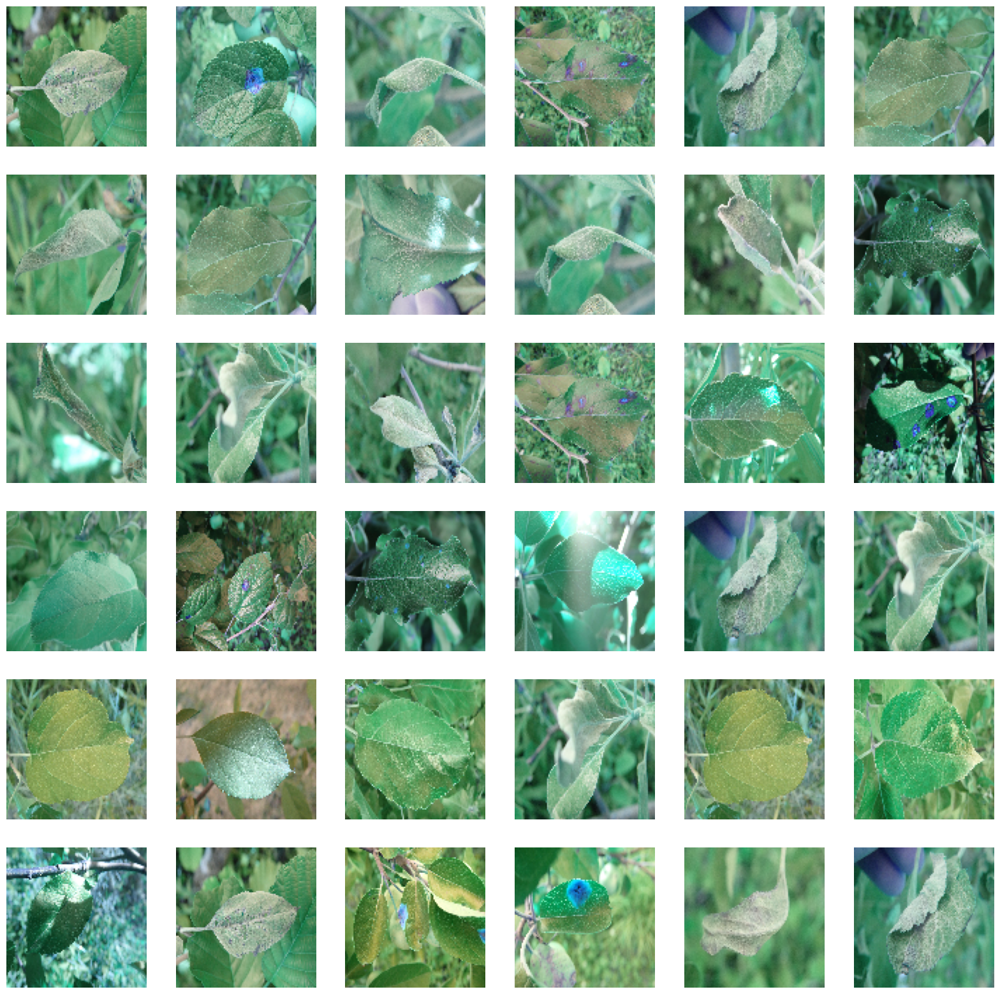

In [23]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')

# Building The Model 


In [24]:
X_train = np.array(X_train)
X_test = np.array(X_test)
X_pred_array = np.array(X_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'X_pred shape  is {X_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (1322, 100, 100, 3)
X_test shape  is (210, 100, 100, 3)
X_pred shape  is (60, 100, 100, 3)
y_train shape  is (1322,)
y_test shape  is (210,)


In [25]:
KerasModel = keras.models.Sequential([
        keras.layers.Conv2D(200,kernel_size=(3,3),activation='relu',input_shape=(s,s,3)),
        keras.layers.Conv2D(150,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Conv2D(120,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(80,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(50,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Flatten() ,    
        keras.layers.Dense(120,activation='relu') ,    
        keras.layers.Dense(100,activation='relu') ,    
        keras.layers.Dense(50,activation='relu') ,        
        keras.layers.Dropout(rate=0.5) ,            
        keras.layers.Dense(6,activation='softmax') ,    
        ])

now to compile the model , using adam optimizer , & sparse categorical crossentropy loss

In [26]:
KerasModel.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

so how the model looks like ? 

In [27]:
print('Model Details are : ')
print(KerasModel.summary())

Model Details are : 
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 98, 98, 200)       5600      
                                                                 
 conv2d_1 (Conv2D)           (None, 96, 96, 150)       270150    
                                                                 
 max_pooling2d (MaxPooling2D  (None, 24, 24, 150)      0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 22, 22, 120)       162120    
                                                                 
 conv2d_3 (Conv2D)           (None, 20, 20, 80)        86480     
                                                                 
 conv2d_4 (Conv2D)           (None, 18, 18, 50)        36050     
                                   

In [28]:
epochs = 20
ThisModel = KerasModel.fit(X_train, y_train, epochs=epochs,batch_size=64,verbose=1)

Epoch 1/20
21/21 [==============================] - 29s 360ms/step - loss: 2.5841 - accuracy: 0.3343
Epoch 2/20
21/21 [==============================] - 4s 171ms/step - loss: 1.2425 - accuracy: 0.4047
Epoch 3/20
21/21 [==============================] - 4s 171ms/step - loss: 1.0696 - accuracy: 0.5182
Epoch 4/20
21/21 [==============================] - 4s 172ms/step - loss: 0.9262 - accuracy: 0.6036
Epoch 5/20
21/21 [==============================] - 4s 172ms/step - loss: 0.8483 - accuracy: 0.6543
Epoch 6/20
21/21 [==============================] - 4s 172ms/step - loss: 0.6987 - accuracy: 0.7156
Epoch 7/20
21/21 [==============================] - 4s 175ms/step - loss: 0.4260 - accuracy: 0.8631
Epoch 8/20
21/21 [==============================] - 4s 173ms/step - loss: 0.3969 - accuracy: 0.8858
Epoch 9/20
21/21 [==============================] - 4s 173ms/step - loss: 0.3381 - accuracy: 0.8918
Epoch 10/20
21/21 [==============================] - 4s 174ms/step - loss: 0.2228 - accuracy: 0.930

In [29]:
ModelLoss, ModelAccuracy = KerasModel.evaluate(X_test, y_test)

print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

7/7 [==============================] - 3s 186ms/step - loss: 0.2140 - accuracy: 0.9571
Test Loss is 0.21398791670799255
Test Accuracy is 0.9571428298950195


In [30]:
epochs = 5
ThisModel = KerasModel.fit(X_train, y_train, epochs=epochs,batch_size=64,verbose=1)

Epoch 1/5
21/21 [==============================] - 4s 178ms/step - loss: 0.1086 - accuracy: 0.9675
Epoch 2/5
21/21 [==============================] - 4s 178ms/step - loss: 0.0859 - accuracy: 0.9773
Epoch 3/5
21/21 [==============================] - 4s 180ms/step - loss: 0.0869 - accuracy: 0.9803
Epoch 4/5
21/21 [==============================] - 4s 180ms/step - loss: 0.0696 - accuracy: 0.9796
Epoch 5/5
21/21 [==============================] - 4s 180ms/step - loss: 0.0779 - accuracy: 0.9834


In [31]:
ModelLoss, ModelAccuracy = KerasModel.evaluate(X_test, y_test)

print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

7/7 [==============================] - 0s 37ms/step - loss: 0.2577 - accuracy: 0.9571
Test Loss is 0.2577243447303772
Test Accuracy is 0.9571428298950195


In [32]:
y_pred = KerasModel.predict(X_test)

print('Prediction Shape is {}'.format(y_pred.shape))

7/7 [==============================] - 0s 32ms/step
Prediction Shape is (210, 6)


In [33]:
y_result = KerasModel.predict(X_pred_array)

print('Prediction Shape is {}'.format(y_result.shape))

2/2 [==============================] - 2s 2s/step
Prediction Shape is (60, 6)


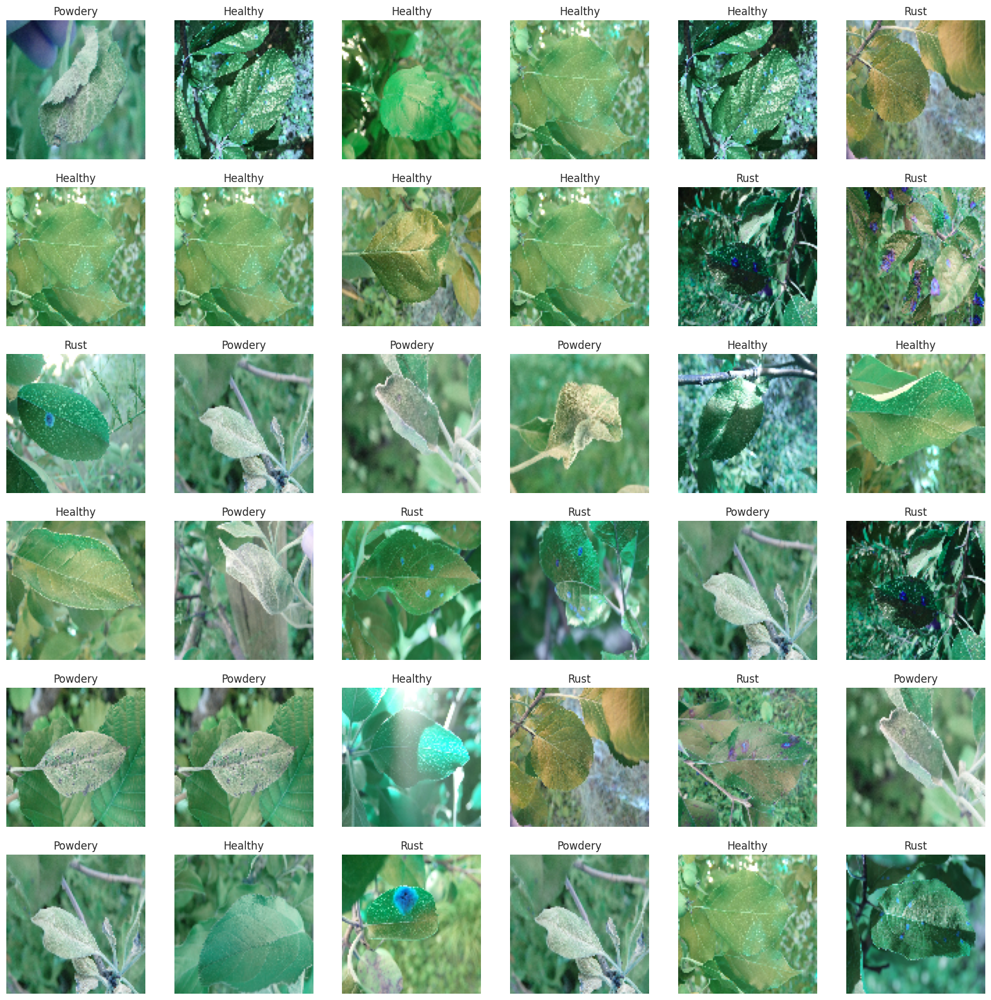

In [34]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(y_result[i])))

In [36]:
KerasModel.save('plant-disease.h5')